# YOLOv5_20230804
cargo 1942개

car 2033개

cargo는 이미지 전체 라벨링

car는 차체 부분만 라벨링

epochs 100

# **1. 구글 드라이브 마운트**
구글 드라이브를 마운트해야 구글 드라이브에 yolo 코드를 다운받고, 드라이브에 있는 데이터로 학습을 할 수 있음

In [ ]:
from google.colab import drive
import os

drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# 작업 경로를 MyDrive/dataset로 변경하여 구글 드라이브에 접속 후 바로 작업 디렉토리를 확인 가능

print('현재 작업 경로 :', os.getcwd())
os.chdir('/content/drive/MyDrive/dataset')
print('변경된 작업 경로 :', os.getcwd())

현재 작업 경로 : /content
변경된 작업 경로 : /content/drive/MyDrive/dataset


#**2. Roboflow Version 다운로드**

코드를 실행시 Roboflow에서 라벨링한 이미지 다운로드

잘못 건들면 처음부터 다시 다운받아야함

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="RoWuJWQ3RKo2rQDMuRxf")
project = rf.workspace("ai-project-wuvsy").project("car-models-r4egq")
dataset = project.version(7).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to Car-Models-7 in yolov5pytorch:: 100%|██████████| 7962/7962 [00:47<00:00, 169.15it/s]


In [ ]:
# 작업 경로를 MyDrive로 변경하여 구글 드라이브에 접속 후 바로 작업 디렉토리를 확인 가능

print('현재 작업 경로 :', os.getcwd())
os.chdir('/content/drive/MyDrive')
print('변경된 작업 경로 :', os.getcwd())

현재 작업 경로 : /content/drive/MyDrive/dataset
변경된 작업 경로 : /content/drive/MyDrive


#**3. YOLOv5 레퍼지토리 다운로드**

코드를 실행시 yolov5 코드 다운로드

In [ ]:
# 처음에 한 번만 실행
# 다음 파일부터는 yolov5 별도로 설치할 필요없음
!git clone https://github.com/ultralytics/yolov5

In [ ]:
# 필요한 패키지 다운로드 및 import
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import yaml
from IPython.display import Image, clear_output

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

/content/drive/MyDrive/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 606.2/606.2 kB 45.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.9 MB/s eta 0:00:00
Setup complete. Using torch 2.0.1+cu118 (Tesla T4)


# **4. 데이터셋 다운로드, yaml 파일 수정 - 각자 진행**

*   사용하고자 하는 커스텀 데이터셋을 구글 드라이브에 'dataset'이라는 폴더에
업로드
*   dataset' 폴더 안에는 학습/평가 데이터와 어노테이션(라벨) 그리고 데이터셋에 대한 설명이 담긴 yaml파일 필요

*   Roboflow의 퍼블릭 데이터셋 사용
  *   roboflow 퍼블릭 데이터셋에서 사용하고 싶은 데이터셋 다운로드해서 해당 폴더에 업로드
  *   여러 포맷으로 다운로드할 수 있는데 그 중에서 TXT - YOLOv5 PyTorch 로 다운로드

*   그 외 커스텀 데이터셋 사용
  *   다른 데이터셋이나 본인이 만든 데이터셋을 사용하고 싶다면 데이터, 라벨, yaml 파일을 모두 퍼블릭 데이터셋의 규격에 맞게 통일해줘야됨 (물론 코드 수정이 가능하다면 데이터셋 로딩하는 코드를 수정해도 됨)
*   yaml 파일 수정
  *   train, val(또는 test) 데이터가 있는 경로 수정 필요

In [ ]:
# 사용할 데이터셋 경로 및 데이터셋의 yaml 파일 경로 지정
data_dir = '/content/drive/MyDrive/dataset/Car-Models-7'
data_yaml = '/content/drive/MyDrive/dataset/Car-Models-7/data.yaml'

In [ ]:
# 데이터셋 yaml 파일 확인
with open(data_yaml) as f:
    film = yaml.load(f, Loader=yaml.FullLoader)
    display(film)

{'names': ['car', 'cargo'],
 'nc': 2,
 'roboflow': {'license': 'CC BY 4.0',
  'project': 'car-models-r4egq',
  'url': 'https://universe.roboflow.com/ai-project-wuvsy/car-models-r4egq/dataset/7',
  'version': 7,
  'workspace': 'ai-project-wuvsy'},
 'test': '../test/images',
 'train': 'Car-Models-7/train/images',
 'val': 'Car-Models-7/valid/images'}

In [ ]:
# yaml 파일의 train, val 데이터가 있는 경로 수정 (기존 경로 -> 구글 드라이브에 저장된 경로로)
film['train'] = '/content/drive/MyDrive/dataset/Car-Models-7/train/images'
film['val'] = '/content/drive/MyDrive/dataset/Car-Models-7/valid/images'

with open(data_yaml, 'w') as f:
    yaml.dump(film, f)

print('변경된 yaml 파일 :')
with open(data_yaml) as f:
    film = yaml.load(f, Loader=yaml.FullLoader)
    display(film)

변경된 yaml 파일 :


{'names': ['car', 'cargo'],
 'nc': 2,
 'roboflow': {'license': 'CC BY 4.0',
  'project': 'car-models-r4egq',
  'url': 'https://universe.roboflow.com/ai-project-wuvsy/car-models-r4egq/dataset/7',
  'version': 7,
  'workspace': 'ai-project-wuvsy'},
 'test': '../test/images',
 'train': '/content/drive/MyDrive/dataset/Car-Models-7/train/images',
 'val': '/content/drive/MyDrive/dataset/Car-Models-7/valid/images'}

# **5. YOLOv5 모델 학습**
*   배치사이즈, 학습 에폭, 모델 사이즈 등을 선택하여 학습시킬 수 있음
*   학습 결과 중 베스트 모델이 저장됨 -> 모델 저장된 경로 확인 필수!
  *   img: 입력 이미지 크기
  *   batch: 배치 사이즈
  *   epochs: 총 학습 에폭
  *   data: 데이터셋 yaml 파일 경로
  *   weights: 모델 웨이트 경로(pre-train된 모델로 학습시키기 때문에)
  *   cache: 캐시 이미지






In [ ]:
!python train.py --img 416 --batch 16 --epochs 100 --data '/content/drive/MyDrive/dataset/Car-Models-7/data.yaml' --weights yolov5s.pt --cache

WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/dataset/Car-Models-7/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, lab

# **6. 학습한 모델 테스트**

In [ ]:
# 테스트 이미지 경로
test_data_dir = film['val']

# 실험 번호 지정 - 진행한 실험이 저장된 경로 확인해서 기입! - runs/train/exp1 인지 exp2, exp3 인지 확인 후 아래 번호 지정
#train_exp_num = 5
train_exp_num = 9

In [ ]:
#!python detect.py --weights runs/train/exp{train_exp_num}/weights/best.pt --img 416 --conf 0.1 --source {test_data_dir}
# roboflow에서 만든 모델의 test/images 경로
#!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source '/content/drive/MyDrive/dataset/Car Models.v2i.yolov5pytorch/test/images'
!python detect.py --weights runs/train/exp9/weights/best.pt --img 416 --conf 0.7 --source '/content/drive/MyDrive/dataset/Car-Models-6/test/images'

WARNING ⚠️ 'ultralytics.yolo.v8' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.models.yolo' instead.
WARNING ⚠️ 'ultralytics.yolo.utils' is deprecated since '8.0.136' and will be removed in '8.1.0'. Please use 'ultralytics.utils' instead.
Note this warning may be related to loading older models. You can update your model to current structure with:
    import torch
    ckpt = torch.load("model.pt")  # applies to both official and custom models
    torch.save(ckpt, "updated-model.pt")

detect: weights=['runs/train/exp9/weights/best.pt'], source=/content/drive/MyDrive/dataset/Car-Models-6/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.7, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=Fal

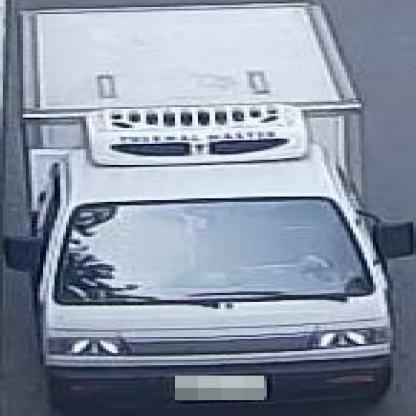

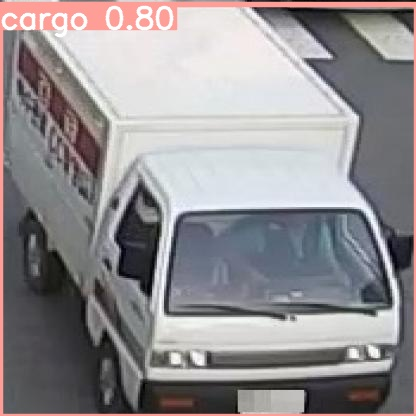

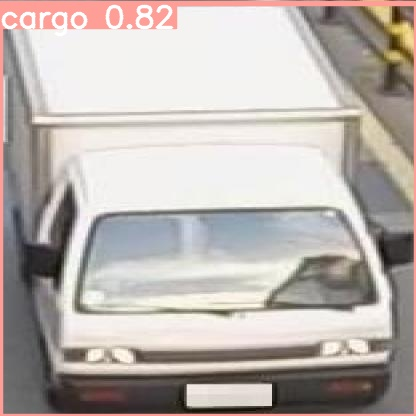

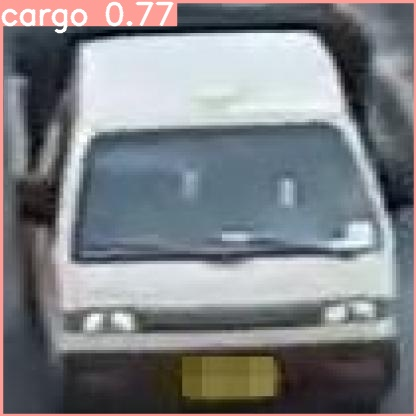

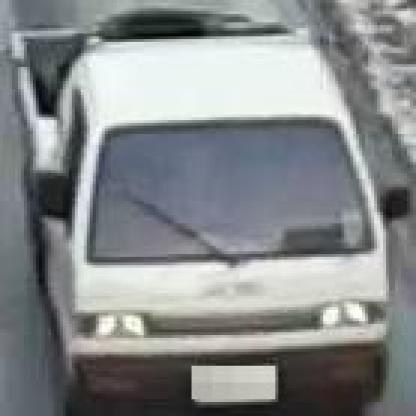

...

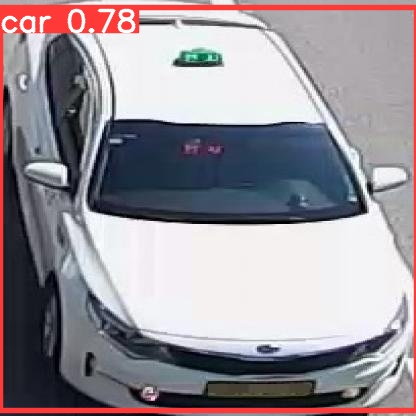

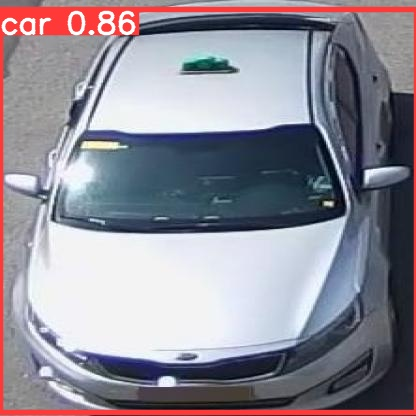

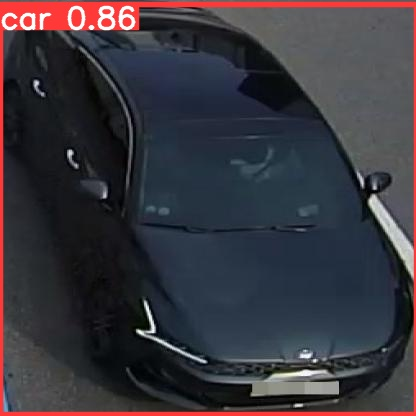

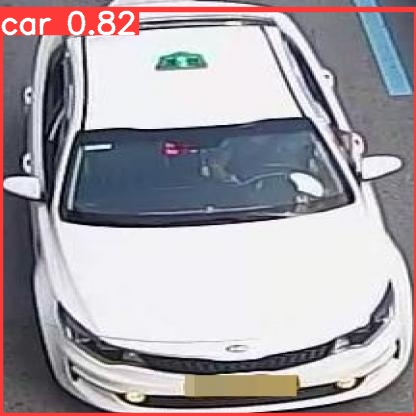

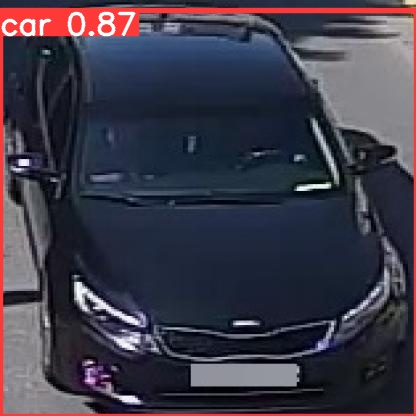

In [ ]:
# 테스트 결과 확인해보기


import glob
from IPython.display import Image, display

#runs/detect/exp 번호
#test_exp_num = 6
test_exp_num = 10


if not os.path.exists('/content/drive/MyDrive/yolov5/runs/detect/exp' + str(test_exp_num) + '/') :
  raise Exception('test_exp_num 을 다시 확인하세요.')

for imageName in glob.glob('/content/drive/MyDrive/yolov5/runs/detect/exp' + str(test_exp_num) + '/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")